In [1]:
%matplotlib notebook

# register and preprocess
Run from here (as `!expipe register etc.`) or terminal (without exclamation)

```
!expipe register openephys /Users/ehagen/COBRA/COBRA_exp_data/1010_2018-10-29_18-02-16_1/ --user Espen --location expipehell --overwrite
!expipe register process --probe-path /Users/ehagen/COBRA/COBRA_exp_data/neuronexus-32-linear-list.prb --sorter ironclust 1010-291018-1
!expipe register psychopy 1010-291018-1
!expipe register mousexy  1010-291018-1
```

In [2]:
import expipe
import os
from expipe_plugin_cinpla.imports import project
import quantities as pq
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy as np
import h5py
import neo
import exdir
import exdir.plugins.git_lfs
import pandas
import scipy.signal as ss
import elephant.current_source_density as csd
from skimage.measure import block_reduce

13:07:59 [I] klustakwik KlustaKwik2 version 0.2.6
c:\users\malinbro\appdata\local\continuum\anaconda3\envs\cobra\lib\site-packages\elephant\spade.py:82: UserWarning: fim.so not found in elephant/spade_src folder,you are using the python implementation of fast fca
  'you are using the python implementation of fast fca')


In [3]:
#plt.rcParams.update(**plt.rcParamsDefault)
plt.rcParams.update({
    #'figure.dpi' : 150,
    'figure.figsize' : [6.4*1.5, 4.8*1.5],
})

In [4]:
expipe.config.settings

{'plugins': ['expipe_plugin_cinpla'],
 'servers': [{'domain': '193.157.210.166',
   'host': 'expipeibv',
   'password': 'sp1k3s0rt1ngm0nst3r',
   'user': 'expipe'},
  {'domain': '193.157.210.141',
   'host': 'torkel-beist',
   'password': '1234',
   'user': 'torkel'},
  {'domain': '193.157,210,141',
   'host': 'torkel-beist',
   'password': '1234',
   'user': 'torkel'}]}

In [10]:
#action_id = '1006-121018-03'
#action_id = '1011-301018-1'
#action_id = '1012-090119-01' # flashes_quick
#action_id = '1012-090119-02' # gratings_quick
#action_id = '1012-090119-04' # flashes_quick
#action_id = '1012-090119-05' # gratings_quick
action_id = '1053-010319-13' # gratings
#action_id = '1012-090119-07' # images
#action_id = '1012-090119-08' # sparsenoise
#action_id = '1012-090119-09'  # static gratings
#action_id = '1012-090119-10' # videos
#action_id = '1012-090119-11' # flashes_quick
#action_id = '1012-090119-11' # gratings_quick
#project_id = PAR.PROJECT_ID
#project = PAR.PROJECT
action = project.actions[action_id]
from expipe_plugin_cinpla.scripts.utils import _get_data_path
exdir_path = _get_data_path(action)
#exdir_path = os.path.join(str(action._backend.path), 'data', 'main.exdir')
channel_group = 0

In [11]:
os.path.join(str(action._backend.path), 'data', 'main.exdir')

'C:\\apps\\COBRA_actions\\actions\\1053-010319-13\\data\\main.exdir'

In [12]:
# Fourier params
NFFT = 512
noverlap = 384

# Stimulus epochs

In [13]:
f = exdir.File(exdir_path, 'r', plugins=[exdir.plugins.quantities, exdir.plugins.git_lfs])
stim = f['processing']['epochs']['visual_stimulus']
grp = stim[list(stim.keys())[0]]
if list(stim.keys()) == ['image']:
    stimulation_type = 'image'
    # nicer label formatting
    labels = np.array([pathlib.PureWindowsPath(lbl).parts[-1].rstrip('.png') for lbl in grp['image'].value])
    epo=neo.Epoch(times=grp['times'].value, 
                  durations=grp['duration'].value*pq.s, 
                  labels=labels)
elif list(stim.keys()) == ['grating']:
    stimulation_type = 'grating'
    annotations = dict(frequency=grp['frequency'].value*pq.Hz,
                       orientation=grp['orientation'].value*pq.deg,
                       phase=grp['phase'].value,
                       spatial_frequency=grp['spatial_frequency'].value
                      )
    df = pandas.DataFrame(annotations)
    # nicer label formatting
    labels = np.array([df.loc[i].to_csv().replace(',', ':').replace('\n', ',') for i in range(df.shape[0])])
    labels = [label.replace('spatial_frequency:', '\omega=') for label in labels]
    labels = [label.replace('frequency:', 'f=') for label in labels]
    labels = [label.replace('orientation:', r'\alpha=') for label in labels]
    labels = [label.replace('phase:', r'\theta=') for label in labels]
    labels = np.array([r'${}$'.format(label) for label in labels])
    epo=neo.Epoch(times=grp['times'].value, 
                  durations=grp['duration'].value*pq.s, 
                  labels=labels,
                  **annotations)
elif list(stim.keys()) == ['sparsenoise']:
    stimulation_type = 'sparsenoise'
    epo=neo.Epoch(times=grp['times'].value, 
                  durations=grp['duration'].value*pq.s, 
                  labels=grp['image'].value)
elif list(stim.keys()) == ['movie']:
    stimulation_type = 'movie'
    # nicer label formatting
    labels = np.array([pathlib.PureWindowsPath(lbl).parts[-1].rstrip('.mp4') for lbl in grp['movie'].value])
    epo=neo.Epoch(times=grp['times'].value, 
                  durations=np.array([30.]*grp['times'].size)*pq.s, #### HACK!!!! ###### 
                  labels=labels)
elif list(stim.keys()) == ['flash']:
    stimulation_type = 'flash'
    epo=neo.Epoch(times=grp['times'].value, 
                  durations=(grp['duration'].value + 0.25)*pq.s, 
                  labels=grp['color'].value)
f.close()

c:\users\malinbro\appdata\local\continuum\anaconda3\envs\cobra\lib\site-packages\ipykernel_launcher.py:20: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.


In [14]:
stimulation_type , epo.times, epo.durations

('grating', array([  7.92503333,  10.90473333,  13.89066667,  16.87643333,
         19.86013333,  22.84753333,  25.83273333,  28.81843333,
         31.805     ,  34.78763333,  37.7747    ,  40.76226667,
         43.74853333,  46.7313    ,  49.719     ,  52.70506667,
         55.6907    ,  58.67613333,  61.6602    ,  64.64686667,
         67.6316    ,  70.60256667,  73.5879    ,  76.5733    ,
         79.55773333,  82.54426667,  85.52983333,  88.51466667,
         91.50193333,  94.48853333,  97.47386667, 100.4591    ,
        103.44553333, 106.42936667, 109.4178    , 112.40273333,
        115.3881    , 118.37313333, 121.35903333, 124.34426667,
        127.3283    , 130.31436667, 133.3024    , 136.28493333,
        139.25533333, 142.24206667, 145.2292    , 148.21496667]) * 1/Hz, array([2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
        2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2.,
        2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2., 2

# Spikes
Load all spiketrains as list of `neo.SpikeTrain` objects

In [15]:
load_waveforms = False # see spike analysis file
if load_waveforms:
    f = exdir.File(exdir_path, 'r', plugins=[exdir.plugins.quantities, exdir.plugins.git_lfs])
    io = neo.ExdirIO(str(exdir_path))
    blk = io.read_block()
    blk_cluster_ids = np.array([str(unit.annotations['cluster_id']) for unit in blk.channel_indexes[0].units])
    t_stop = f.attrs['session_duration']
    UnitTimes = f['processing']['electrophysiology']['channel_group_0']['UnitTimes']
    units = np.sort(list(UnitTimes.keys()))
    spiketrains = []
    for unit in units:
        if not UnitTimes[unit].attrs['cluster_group'] == 'noise':
            spiketrains += [neo.SpikeTrain(UnitTimes[unit]['times'].value, t_stop=t_stop, 
                                          name=unit, description=UnitTimes[unit].attrs['cluster_group'],
                                          waveforms=blk.segments[0].spiketrains[np.where(blk_cluster_ids==unit)[0][0]].waveforms)]
    f.close()
else:
    f = exdir.File(exdir_path, 'r', plugins=[exdir.plugins.quantities, exdir.plugins.git_lfs])
    t_stop = f.attrs['session_duration']
    UnitTimes = f['processing']['electrophysiology']['channel_group_0']['UnitTimes']
    units = np.sort(list(UnitTimes.keys()))
    spiketrains = [neo.SpikeTrain(UnitTimes[unit]['times'].value, t_stop=t_stop, 
                                  name=unit, description=UnitTimes[unit].attrs['cluster_group'],
                                  waveforms=None) 
                   for unit in units if not UnitTimes[unit].attrs['cluster_group'] == 'noise']
    f.close()

# LFP, MUA and CSD
LFPs, MUAs and corresponding reconstructed CSDs defined as `neo.AnalogSignal` objects

In [33]:
f = exdir.File(exdir_path, 'r', plugins=[exdir.plugins.quantities])
# LFP
_lfp = f['processing']['electrophysiology']['channel_group_0']['LFP']
keys = list(_lfp.keys())
electrode_value = [_lfp[key]['data'].value.flatten() for key in keys]
electrode_idx = [_lfp[key].attrs['electrode_idx'] for key in keys]
sampling_rate = _lfp[keys[0]].attrs['sample_rate']
units = _lfp[keys[0]]['data'].attrs['unit']
LFP = np.r_[[_lfp[key]['data'].value.flatten() for key in keys]].T
#LFP = (LFP.T - np.median(np.array(LFP), axis=-1)).T #CMR reference
#LFP = (LFP.T - LFP[:, 0]).T # use topmost channel as reference
LFP = LFP[:, np.argsort(electrode_idx)]

LFP = neo.AnalogSignal(LFP, 
                       units=units, t_stop=t_stop, sampling_rate=sampling_rate)
LFP = LFP.rescale('mV')

# MUA
_mua = f['processing']['electrophysiology']['channel_group_0']['MUA']
keys = list(_mua.keys())
sampling_rate = _mua[keys[0]].attrs['sample_rate']
units = _mua[keys[0]]['data'].attrs['unit']
MUA = np.r_[[_mua[key]['data'].value.flatten() for key in keys]].T
MUA = MUA[:, np.argsort(electrode_idx)]
MUA = neo.AnalogSignal(MUA, 
                       units=units, t_stop=t_stop, sampling_rate=sampling_rate)
MUA = MUA.rescale('mV')
f.close()

In [34]:
# CSD
coords=np.arange(LFP.shape[1]).reshape((-1,1))*25*pq.um
h = np.ones(coords.size)*25*pq.um
diam = 200*pq.um
CSD = csd.estimate_csd(LFP, coords=coords, h=h, diam=diam, 
                       method='StepiCSD', process_estimate=False).rescale('uA/mm**3')

# MouseXY tracking

In [35]:
f = exdir.File(exdir_path, 'r', plugins=[exdir.plugins.quantities])
tracks = dict()
for key, value in f['processing']['tracking']['trackball']['position'].items():
    tracks[key] = value
f.close()

# timeseries analysis

<IPython.core.display.Javascript object>


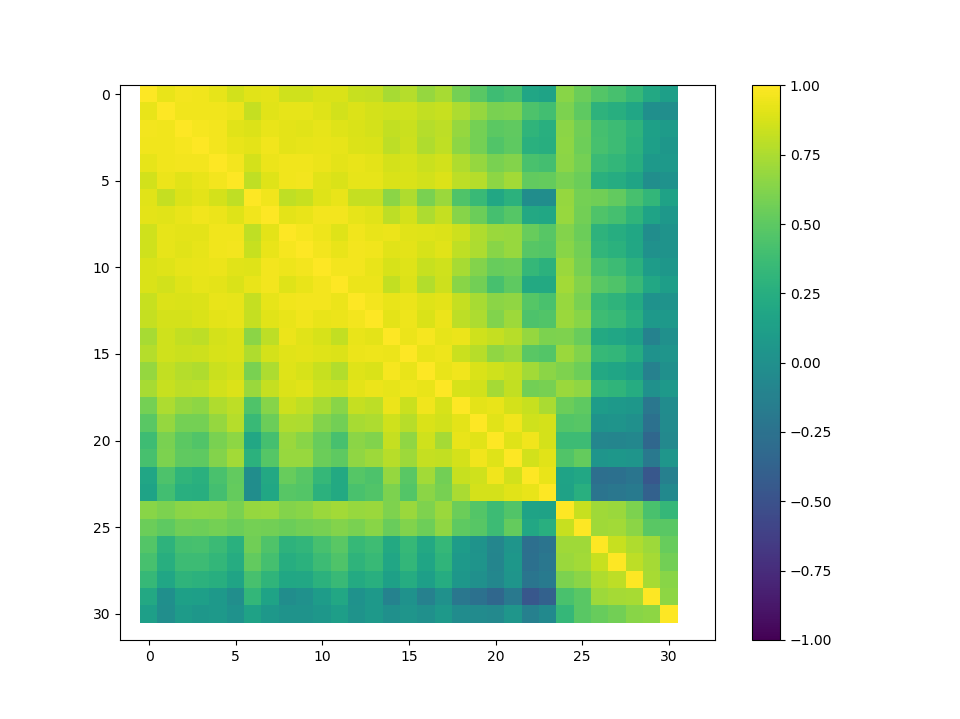

c:\users\malinbro\appdata\local\continuum\anaconda3\envs\cobra\lib\site-packages\numpy\lib\function_base.py:2530: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
c:\users\malinbro\appdata\local\continuum\anaconda3\envs\cobra\lib\site-packages\numpy\lib\function_base.py:2531: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


In [36]:
# Pairwise LFP channel Pearson correlation coefficient
fig, ax = plt.subplots(1, 1)
im = ax.imshow(np.corrcoef(LFP.T), vmin=-1, vmax=1)
ax.axis(ax.axis('equal'))
fig.colorbar(im)

In [52]:
# def some plotting functions
def remove_axis_junk(ax, lines=['right', 'top']):
    for loc, spine in ax.spines.items():
        if loc in lines:
            spine.set_color('none')            
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')

def draw_lineplot(
        ax, data, dt=0.1,
        T=(0, 200),
        scaling_factor=1.,
        vlimround=None,
        label='local',
        scalebar=True,
        unit='mV',
        ylabels=True,
        color='k',
        ztransform=True,
        filter=False,
        filterargs=dict(N=2, Wn=0.02, btype='lowpass')
        ):
    ''' draw some nice lines'''
    
    tvec = np.arange(data.shape[1])*dt
    if T[0] < 0:
        tvec += T[0]
    try:
        tinds = (tvec >= T[0]) & (tvec <= T[1])
    except TypeError:
        print(data.shape, T)
        raise Exception
    
    # apply temporal filter
    if filter:
        b, a = ss.butter(**filterargs)
        data = ss.filtfilt(b, a, data, axis=-1)
    
    #subtract mean in each channel
    if ztransform:
        dataT = data.T - data.mean(axis=1)
        data = dataT.T

    zvec = np.arange(data.shape[0])
    vlim = abs(data[:, tinds]).max()
    if vlimround is None:
        vlimround = 2.**np.round(np.log2(vlim)) / scaling_factor
    else:
        pass

    yticklabels=[]
    yticks = []
    
    for i, z in enumerate(zvec):
        if i == 0:
            ax.plot(tvec[tinds], data[i][tinds] / vlimround + z, lw=.5,
                    rasterized=False, label=label, clip_on=False,
                    color=color)
        else: 
            ax.plot(tvec[tinds], data[i][tinds] / vlimround + z, lw=.5,
                    rasterized=False, clip_on=False,
                    color=color)
        yticklabels.append('ch. %i' % (i+1))
        yticks.append(z)
        
    if scalebar:
        ax.plot([tvec[tinds][-1], tvec[tinds][-1]],
                [zvec[-1], zvec[-2]], lw=2, color='k', clip_on=False)
        ax.text(tvec[tinds][-1]+np.diff(T)*0.0, np.mean([zvec[-1], zvec[-2]]),
                '$2^{' + '{}'.format(int(np.log2(vlimround))) + '}$ ' + '{0}'.format(unit),
                color='r', rotation='vertical',
                va='center', zorder=100)

    ax.axis(ax.axis('tight'))
    ax.yaxis.set_ticks(yticks)
    if ylabels:
        ax.yaxis.set_ticklabels(yticklabels)
        #ax.set_ylabel('channel', labelpad=0.1)
    else:
        ax.yaxis.set_ticklabels([])
    remove_axis_junk(ax, lines=['right', 'top'])
    ax.set_xlabel(r'time (ms)', labelpad=0.1)
    
    return vlimround

def draw_imageplot(
        ax, data, dt=0.1,
        T=(0, 200),
        scaling_factor=1.,
        label='local',
        unit='mV',
        ylabels=True,
        vmax=None,
        color='k',
        colorbar=True,
        ztransform=False,
        filter=False,
        filterargs=dict(N=2, Wn=0.02, btype='lowpass')):
    ''' draw some nice images'''
    
    tvec = np.arange(data.shape[1])*dt
    if T[0] < 0:
        tvec += T[0]
    try:
        tinds = (tvec >= T[0]) & (tvec <= T[1])
    except TypeError:
        print(data.shape, T)
        raise Exception
    
    # apply temporal filter
    if filter:
        b, a = ss.butter(**filterargs)
        data = ss.filtfilt(b, a, data, axis=-1)
    
    #subtract mean in each channel
    if ztransform:
        dataT = data.T - data.mean(axis=1)
        data = dataT.T

    zvec = np.arange(data.shape[0])

    yticklabels=[]
    yticks = []    
    for i, z in enumerate(zvec):
        yticklabels.append('ch. %i' % (i+1))
        yticks.append(z)

    if vmax is None:
        vmin = -data.std()*2.5
        vmax = data.std()*2.5
    else:
        vmin = -vmax
        
    # plot data as image
    im = ax.imshow(data[:, tinds], 
                   extent=(tvec[tinds][0], tvec[tinds][-1], zvec[0]-0.5, zvec[-1]+0.5), 
                   vmin=vmin, vmax=vmax, 
                   zorder=-1, cmap='bwr_r', interpolation='bilinear',
                   origin='lower')

    if colorbar:
        rect = np.array(ax.get_position().bounds)
        rect[0] += rect[2] + 0.01
        rect[1] = 0.3
        rect[2] = 0.01
        rect[3] = 0.4
        cax = fig.add_axes(rect)
        cbar = plt.colorbar(im, cax=cax)
        cbar.set_label(unit)


    ax.axis(ax.axis('tight'))
    ax.yaxis.set_ticks(yticks)
    if ylabels:
        ax.yaxis.set_ticklabels(yticklabels)
        #ax.set_ylabel('channel', labelpad=0.1)
    else:
        ax.yaxis.set_ticklabels([])
    remove_axis_junk(ax, lines=['right', 'top'])
    ax.set_xlabel(r'time (ms)', labelpad=0.1)
    
    return


<IPython.core.display.Javascript object>


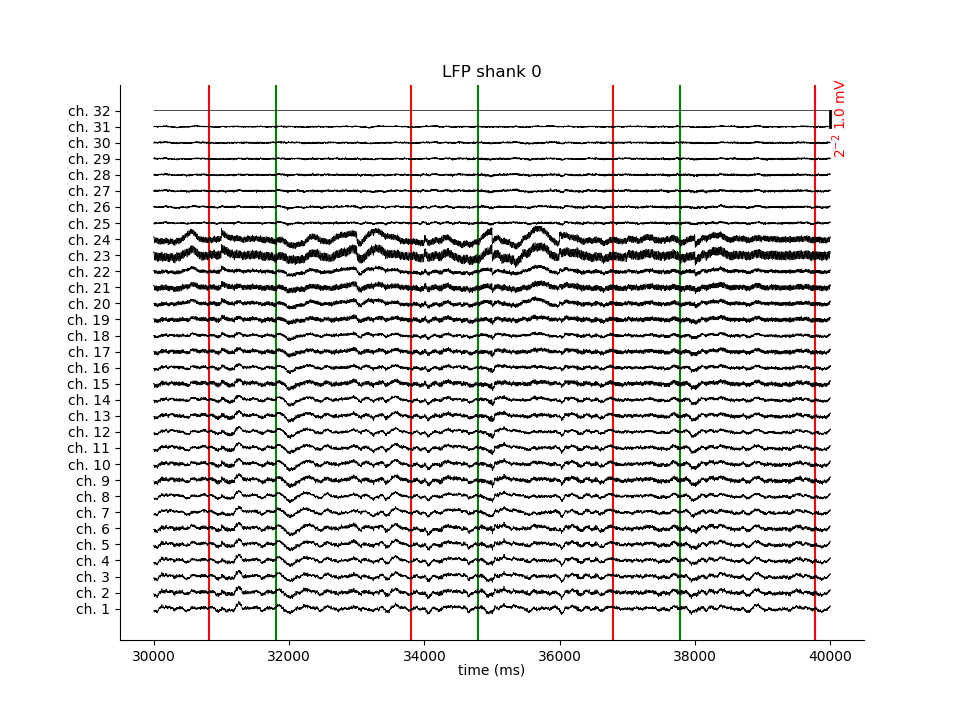

Text(0.5, 1.0, 'LFP shank 0')

In [53]:
# LFP time series
fig, ax = plt.subplots(1, 1)
draw_lineplot(ax, np.array(LFP).T, dt=1., T=(30000, 40000), unit=str(LFP.units))
axis = ax.axis()
ax.vlines(epo.times*1000, axis[2], axis[3], 'g')
ax.vlines((epo.times+epo.durations)*1000, axis[2], axis[3], 'r')
ax.set_title('LFP shank {}'.format(channel_group))

<IPython.core.display.Javascript object>


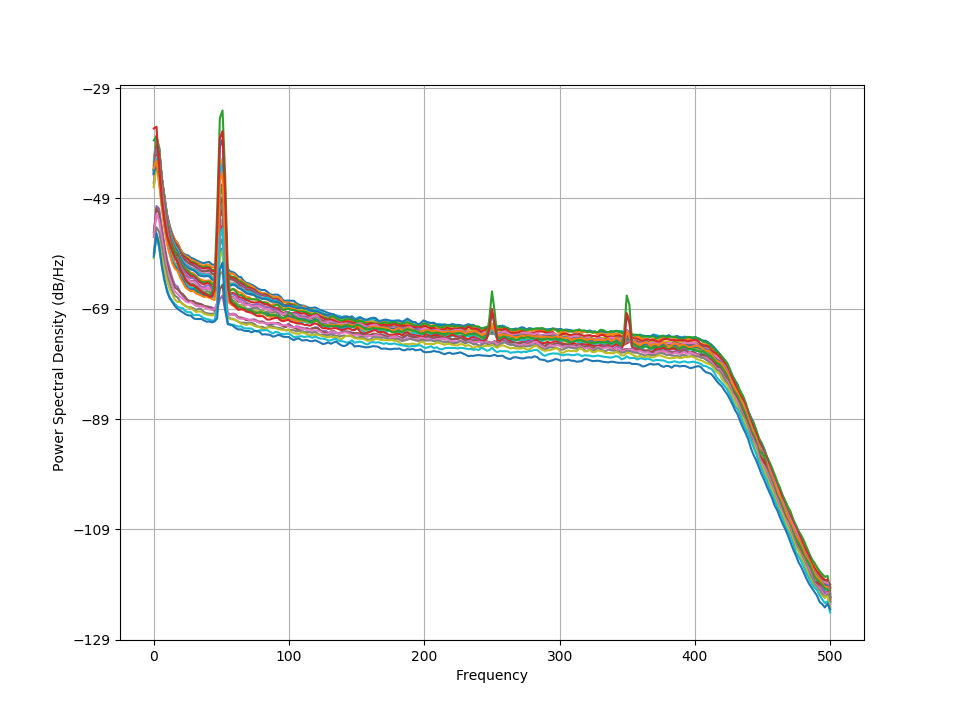

In [50]:
# LFP power spectra (per channel)
fig, ax = plt.subplots(1, 1)
for x in LFP.T:
    ax.psd(np.array(x), NFFT=NFFT, Fs=float(LFP.sampling_rate.simplified), noverlap=noverlap)

<IPython.core.display.Javascript object>


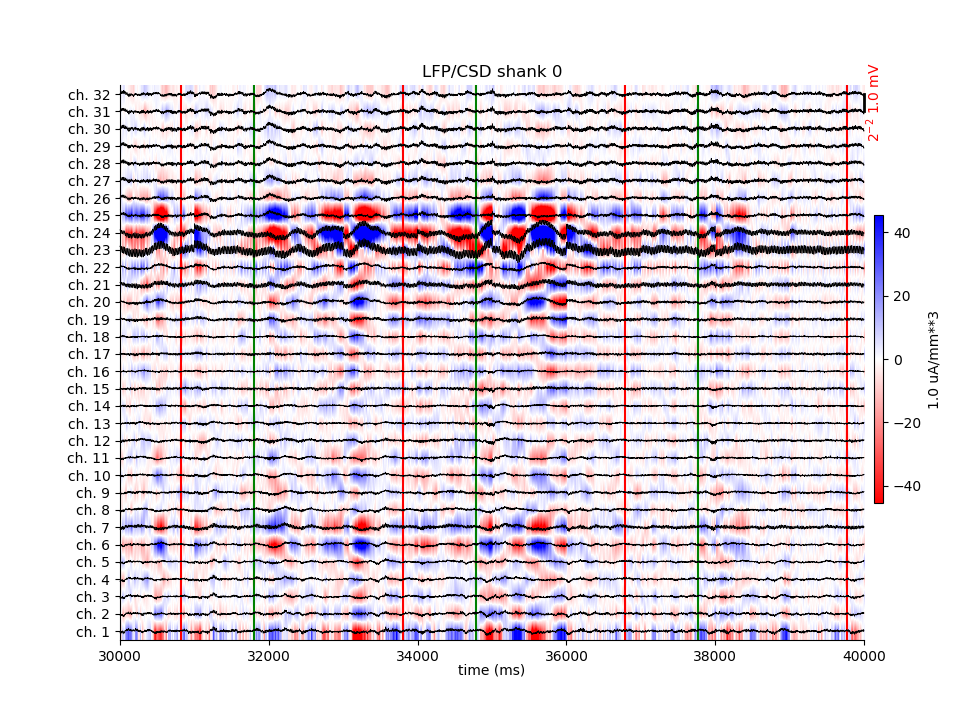

Text(0.5, 1.0, 'LFP/CSD shank 0')

In [31]:
# LFP/CSD time series
fig, ax = plt.subplots(1, 1)
draw_lineplot(ax, np.array(LFP).T, dt=1., T=(30000, 40000), unit=str(LFP.units))
draw_imageplot(ax, np.array(CSD).T, dt=1., T=(30000, 40000), unit=str(CSD.units))
axis = ax.axis()
ax.vlines(epo.times*1000, axis[2], axis[3], 'g')
ax.vlines((epo.times+epo.durations)*1000, axis[2], axis[3], 'r')
ax.set_title('LFP/CSD shank {}'.format(channel_group))

<IPython.core.display.Javascript object>


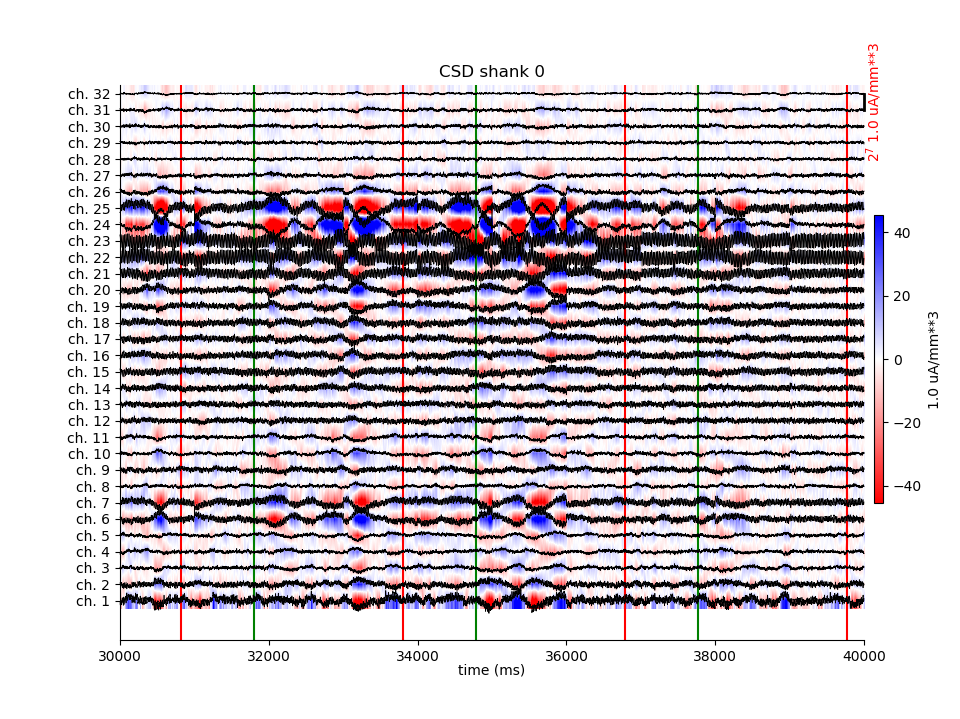

Text(0.5, 1.0, 'CSD shank 0')

In [42]:
# CSD time series
fig, ax = plt.subplots(1, 1)
draw_lineplot(ax, np.array(CSD).T, dt=1., T=(30000, 40000), unit=str(CSD.units))
draw_imageplot(ax, np.array(CSD).T, dt=1., T=(30000, 40000), unit=str(CSD.units))
axis = ax.axis()
ax.vlines(epo.times*1000, axis[2], axis[3], 'g')
ax.vlines((epo.times+epo.durations)*1000, axis[2], axis[3], 'r')
ax.set_title('CSD shank {}'.format(channel_group))

<IPython.core.display.Javascript object>


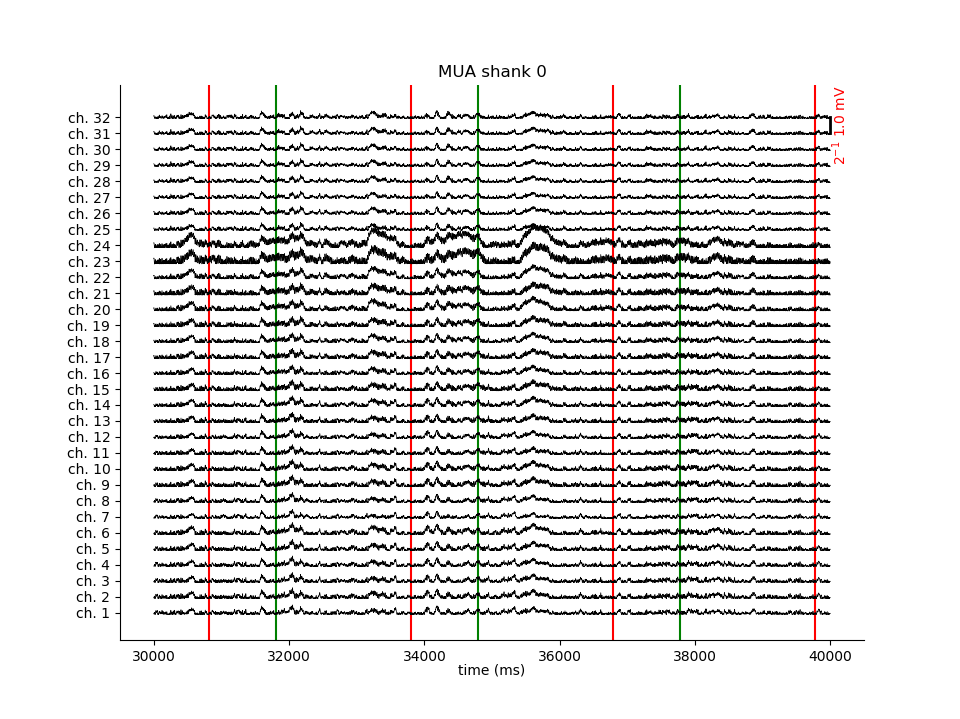

Text(0.5, 1.0, 'MUA shank 0')

In [43]:
# MUA time series
fig, ax = plt.subplots(1, 1)
draw_lineplot(ax, np.array(MUA).T, dt=1., T=(30000, 40000), unit=str(MUA.units))
axis = ax.axis()
ax.vlines(epo.times*1000, axis[2], axis[3], 'g')
ax.vlines((epo.times+epo.durations)*1000, axis[2], axis[3], 'r')
ax.set_title('MUA shank {}'.format(channel_group))

In [ ]:
# plot MUA RMS across depth (MUA is already rectified). 
# Not identical, but inspired by Senzai et al., 
# Layer-Specific Physiological Features and Interlaminar Interactions in the 
# Primary Visual Cortex of the Mouse, Neuron (2018), https://doi.org/10.1016/j.neuron.2018.12.009
fig, ax = plt.subplots(1, 1)
ax.plot(MUA.mean(axis=0), np.arange(MUA.shape[1]), label=r'$\overline{\mathrm{MUA}}$')
ax.plot(MUA.std(axis=0), np.arange(MUA.shape[1]), label=r'$\sigma_\mathrm{MUA}$')
ax.set_yticks(range(MUA.shape[1]))
ax.legend(loc='best')
ax.set_yticklabels(['ch. {}'.format(i+1) for i in range(MUA.shape[1])])
ax.set_xlabel(r'$\overline{\mathrm{MUA}} & \sigma_\mathrm{MUA}$')
ax.set_title('mean MUA across channels')

## Whitened LFPs

In [44]:
# Compare LFP with whitened (spatially decorrelated) LFP in some frequency band
# Filter coefficients
b, a = ss.butter(N=1, Wn=np.array([1., 50.]) / LFP.sampling_rate * 2, btype='bandpass')
# filtered LFP
fLFP = neo.AnalogSignal(ss.filtfilt(b, a, LFP, axis=0), units=LFP.units, sampling_rate=LFP.sampling_rate)
# and corresponding whitening matrix
M = np.cov(fLFP.T)
w, E = np.linalg.eig(M)
W = np.array(np.matrix(E)*np.matrix(np.diag(w**-0.5))*np.matrix(E).T)*LFP.shape[1]
# compute the whitened filtered LFP
wfLFP = np.dot(W, fLFP.T).T

#fig, axes = plt.subplots(2, 1)
#ax = axes[0]
fig, ax = plt.subplots(1,1)
draw_lineplot(ax, np.array(fLFP.T), dt=1., T=(30000, 40000), unit=LFP.units)
axis = ax.axis()
ax.vlines(epo.times*1000, axis[2], axis[3], 'g')
ax.vlines((epo.times+epo.durations)*1000, axis[2], axis[3], 'r')

#ax = axes[1]
fig, ax = plt.subplots(1,1)
draw_lineplot(ax, np.array(wfLFP.T), dt=1., T=(30000, 40000), unit=LFP.units)
axis = ax.axis()
ax.vlines(epo.times*1000, axis[2], axis[3], 'g')
ax.vlines((epo.times+epo.durations)*1000, axis[2], axis[3], 'r')

c:\users\malinbro\appdata\local\continuum\anaconda3\envs\cobra\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in power
  if __name__ == '__main__':


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

ValueError: cannot convert float NaN to integer

<IPython.core.display.Javascript object>


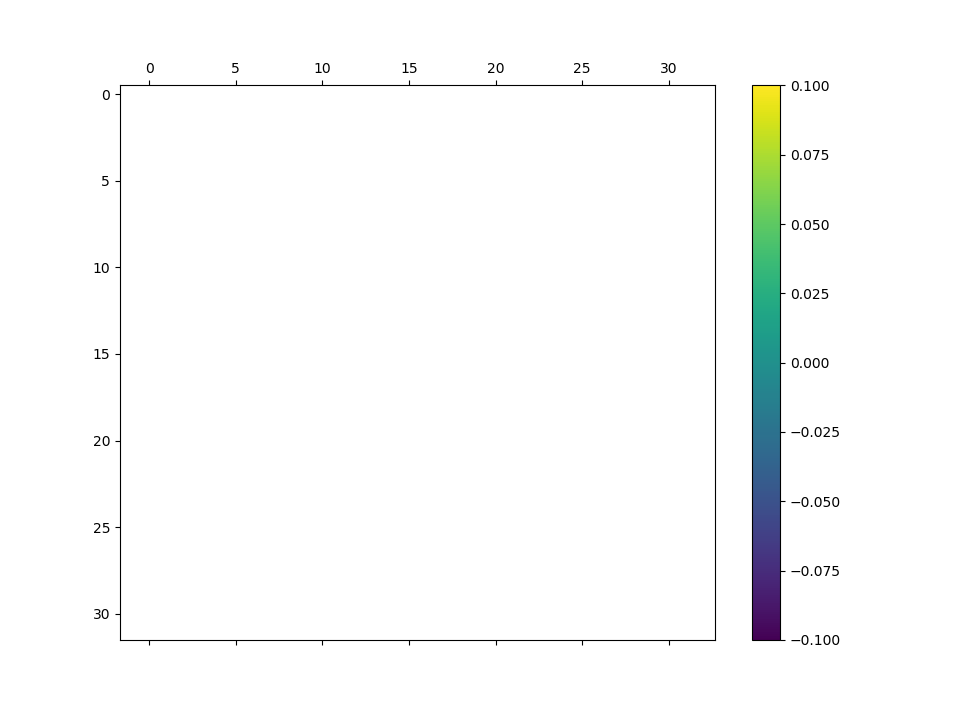

In [46]:
# plot whitening matrix
fig, ax = plt.subplots(1,1)
im = ax.matshow(W)
ax.axis(ax.axis('equal'))
fig.colorbar(im)

In [47]:
# Compare LFP with whitened (spatially decorrelated) LFP without frequency filtering
# Filter coefficients
b, a = ss.butter(N=1, Wn=np.array([1., 50.]) / LFP.sampling_rate * 2, btype='bandpass')
# filtered LFP
#fLFP = neo.AnalogSignal(ss.filtfilt(b, a, LFP, axis=0), units=LFP.units, sampling_rate=LFP.sampling_rate)
# and corresponding whitening matrix
M = np.cov(LFP.T)
w, E = np.linalg.eig(M)
W = np.array(np.matrix(E)*np.matrix(np.diag(w**-0.5))*np.matrix(E).T)*LFP.shape[1]
# compute the whitened filtered LFP
wLFP = np.dot(W, LFP.T).T

#fig, axes = plt.subplots(2, 1)
#ax = axes[0]
fig, ax = plt.subplots(1,1)
draw_lineplot(ax, np.array(LFP.T), dt=1., T=(30000, 40000), unit=LFP.units)
axis = ax.axis()
ax.vlines(epo.times*1000, axis[2], axis[3], 'g')
ax.vlines((epo.times+epo.durations)*1000, axis[2], axis[3], 'r')

#ax = axes[1]
fig, ax = plt.subplots(1,1)
draw_lineplot(ax, np.array(wLFP.T), dt=1., T=(30000, 40000), unit=LFP.units)
axis = ax.axis()
ax.vlines(epo.times*1000, axis[2], axis[3], 'g')
ax.vlines((epo.times+epo.durations)*1000, axis[2], axis[3], 'r')

c:\users\malinbro\appdata\local\continuum\anaconda3\envs\cobra\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: divide by zero encountered in power
  if __name__ == '__main__':


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

ValueError: cannot convert float NaN to integer

In [ ]:
# plot whitening matrix
fig, ax = plt.subplots(1,1)
im = ax.matshow(W)
ax.axis(ax.axis('equal'))
fig.colorbar(im)

# CSD/LFP/MUA/wLFP of different trials compared to mean

<IPython.core.display.Javascript object>


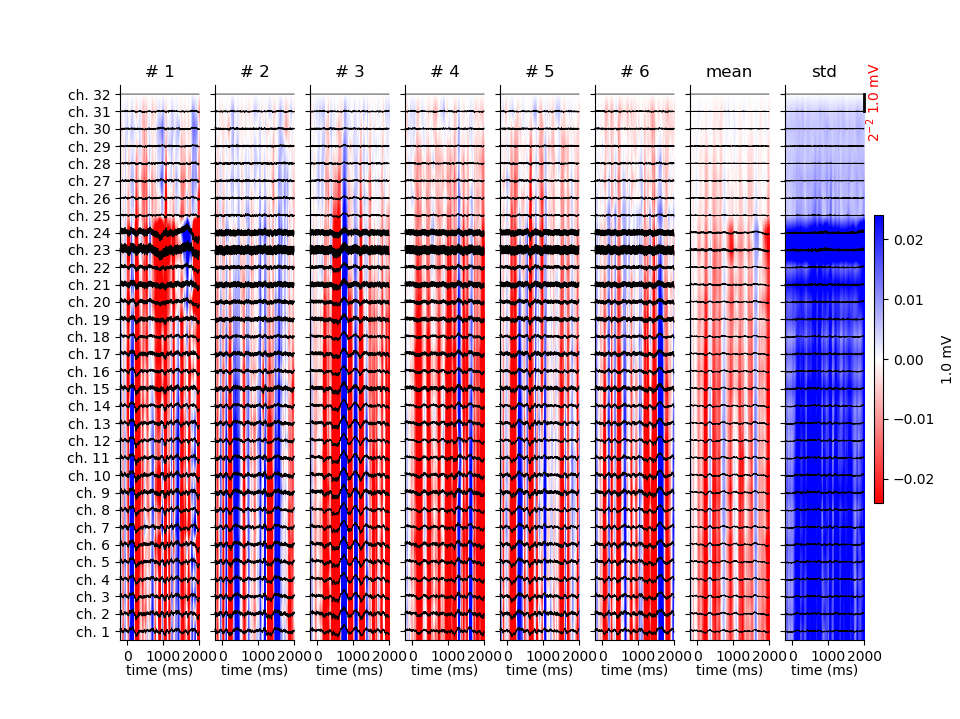

<IPython.core.display.Javascript object>


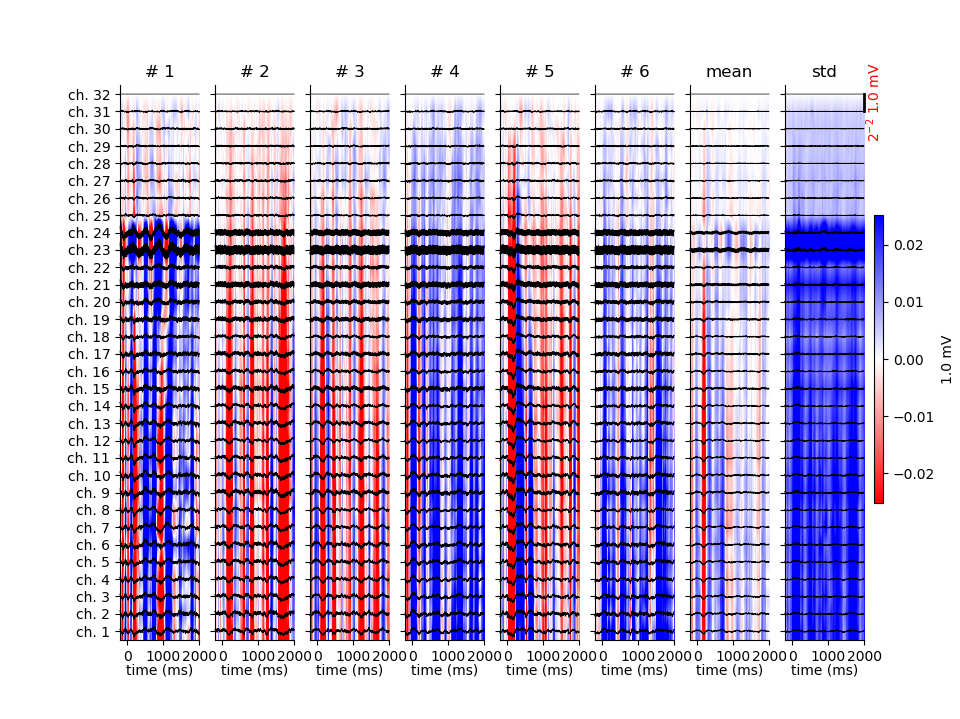

<IPython.core.display.Javascript object>


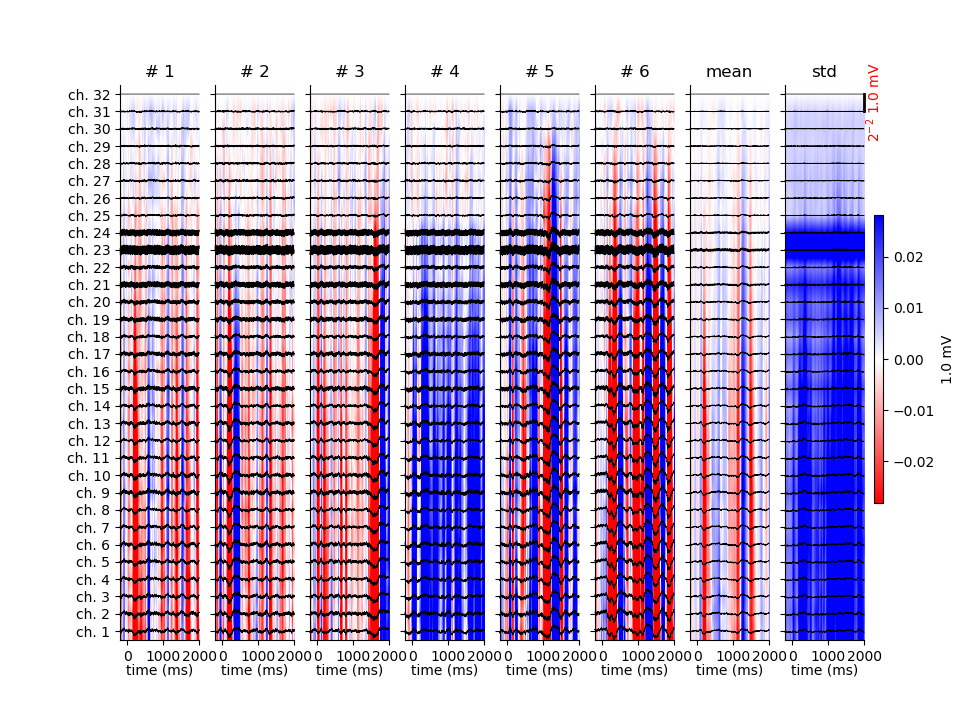

<IPython.core.display.Javascript object>


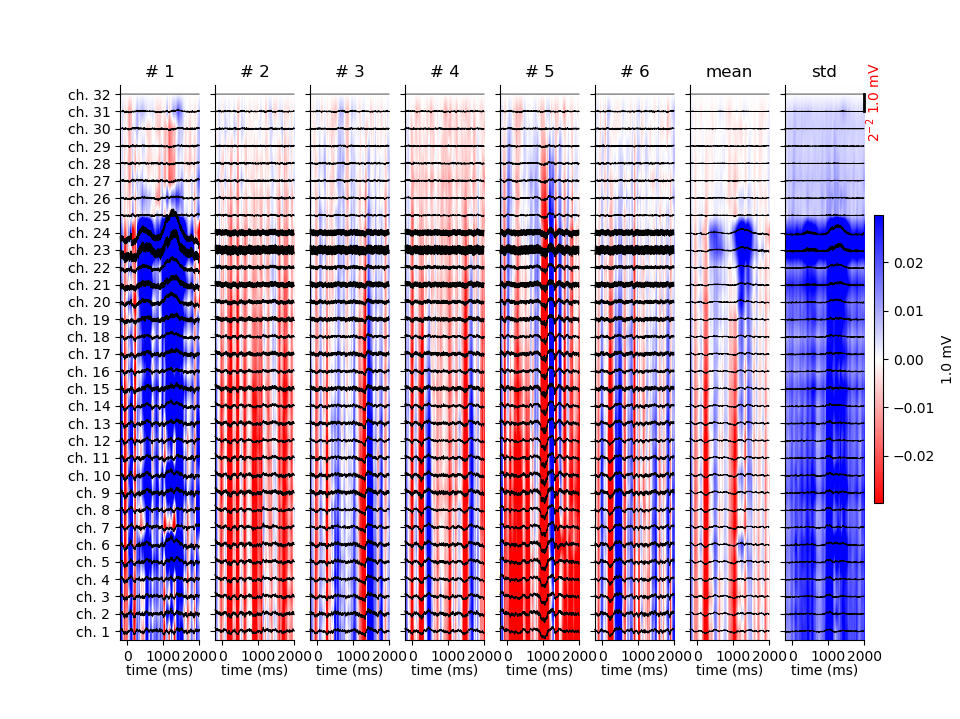

<IPython.core.display.Javascript object>


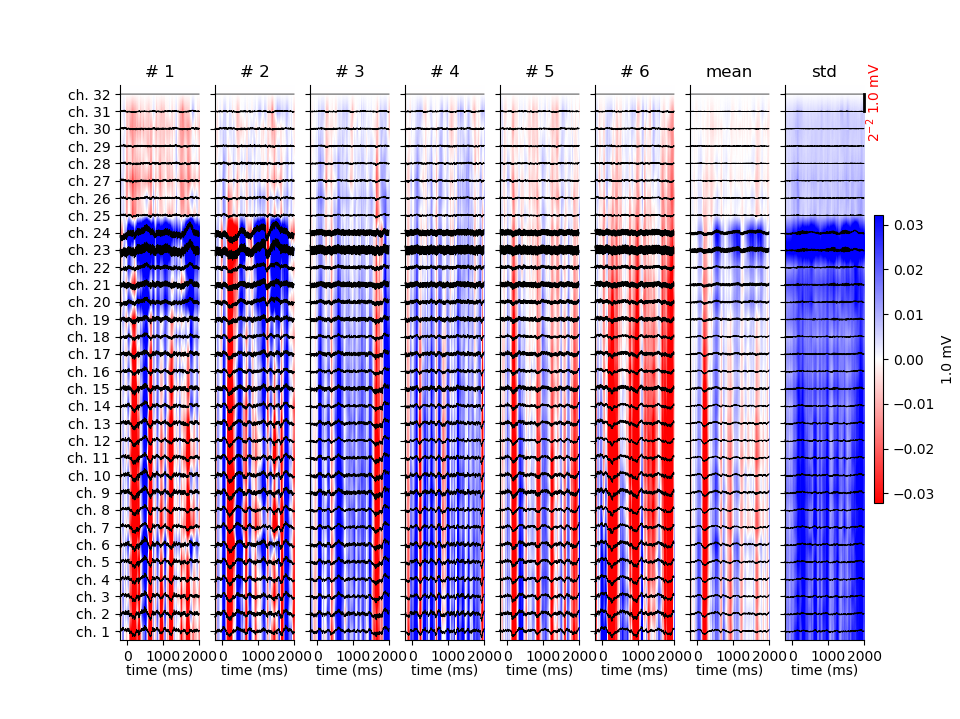

<IPython.core.display.Javascript object>


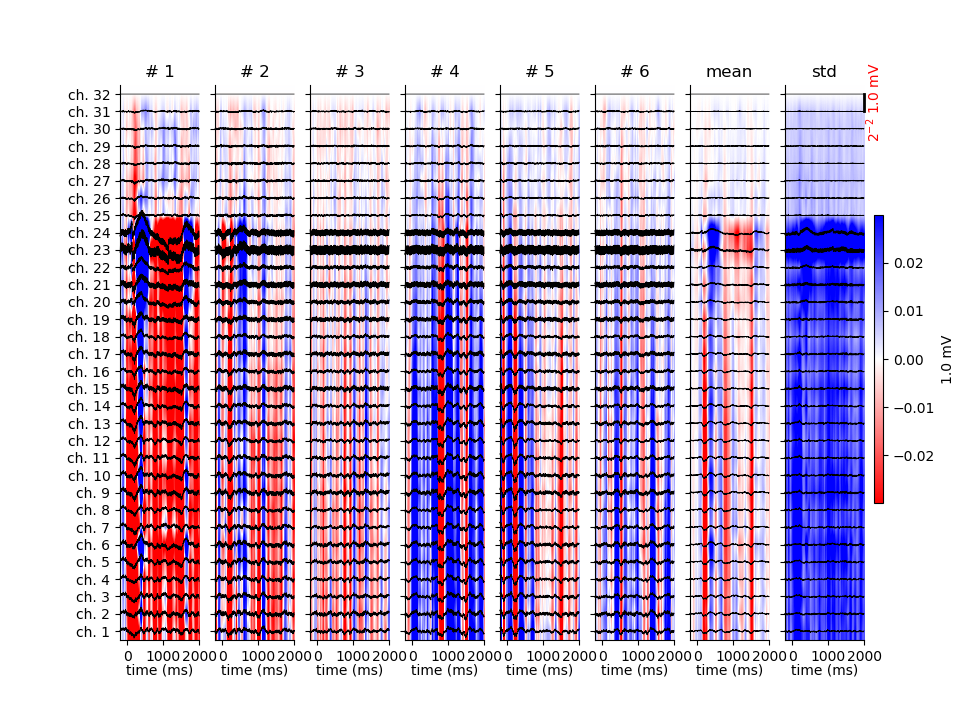

<IPython.core.display.Javascript object>


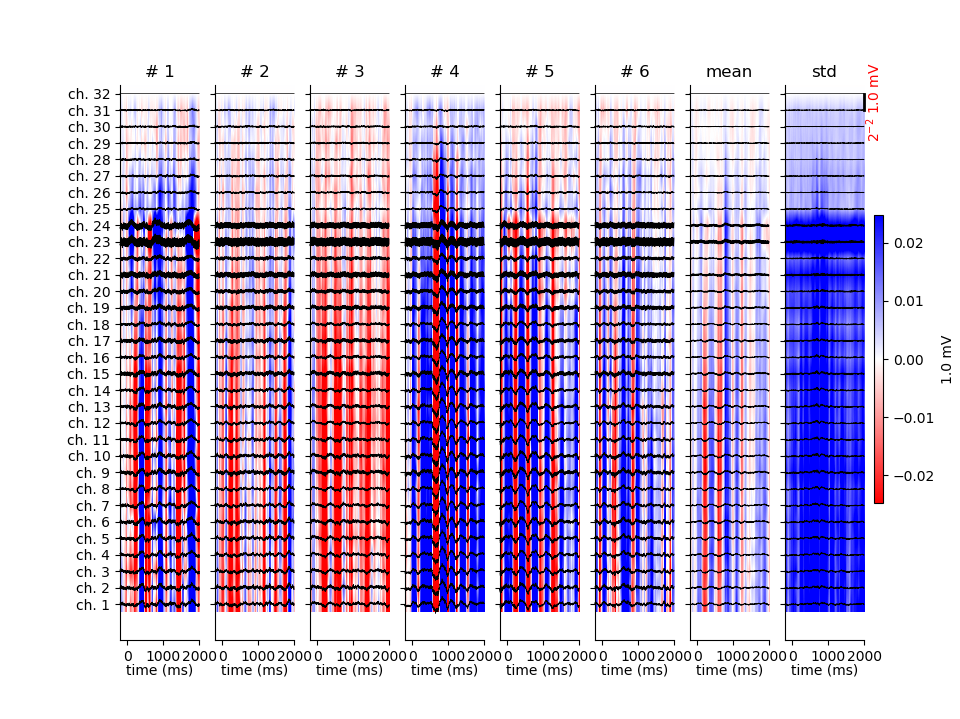

<IPython.core.display.Javascript object>


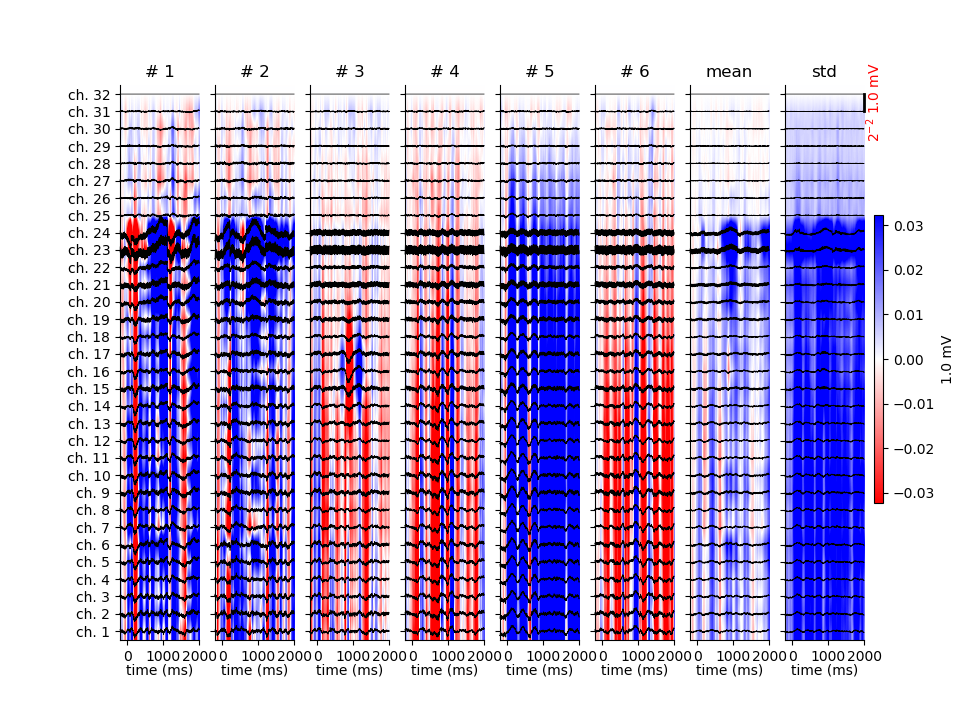

In [48]:
data = 'LFP' # or 'LFP' or 'MUA' or 'fLFP' or 'wfLFP' or 'wLFP'
if data == 'CSD':
    signal = CSD
    vlimround=2**6
elif data == 'LFP':
    signal = LFP
    vlimround = 2**-2
elif data == 'fLFP':
    signal = fLFP
    vlimround = 2**-2
elif data == 'MUA':
    signal = MUA
    vlimround = 2**-4
elif data == 'wfLFP':
    signal = wfLFP
    vlimround = 2**6
elif data == 'wLFP':
    signal = wLFP
    vlimround = 2**6

prestim_duration = 200*pq.ms
    
if stimulation_type in ['image', 'grating', 'flash']:
    labels_ = np.unique(epo.labels)
    if labels_.size < 10:
        pass
    else:
        labels_ = labels_[:10]
    for label in labels_:
        inds = epo.labels == label
        container = np.zeros((int(((prestim_duration + epo.durations)*signal.sampling_rate).simplified[0]), 
                              signal.shape[1], 
                              inds.sum()))
        for j, (time, duration) in enumerate(zip(epo.times[inds], epo.durations[inds])):
            time_slice = signal.time_slice(time-prestim_duration, time+duration)
            if time_slice.shape != container[:, :, j].shape:
                container[:, :, j] = time_slice[:container.shape[0], :]
            else:
                container[:, :, j] = time_slice
        # center using prestim duration
        container = container - container[:int(prestim_duration)].mean(axis=0)       
        
        # colorbar range
        vmax = container.mean(axis=-1).std()*2.5
        
        # find a suitable number of trials to show:
        ncols = epo.labels.size // np.unique(epo.labels).size
        if ncols > 8:
            ncols = 10
        else:
            ncols += 2
        
        fig, axes = plt.subplots(ncols=ncols, nrows=1, sharey=True)
        fig.suptitle(label)
        for i, ax in enumerate(axes):
            if i < (ncols - 2):
                draw_lineplot(ax, container[:,:,i].T, 
                              dt=1., 
                              T=(-float(prestim_duration), float(duration.rescale('ms'))), 
                              vlimround=vlimround,
                              scalebar=False,
                              unit=str(signal.units),
                             )
                draw_imageplot(ax, container[:,:,i].T, 
                               dt=1., 
                               T=(-float(prestim_duration), float(duration.rescale('ms'))), 
                               unit=str(signal.units),
                               colorbar=False,
                               #ztransform=True,
                               vmax=vmax
                              )
                ax.set_title('# {}'.format(i+1))
            elif i == (ncols - 2): # MEAN
                draw_lineplot(ax, container.mean(axis=-1).T, 
                              dt=1., 
                              T=(-float(prestim_duration), float(duration.rescale('ms'))), 
                              vlimround=vlimround,
                              scalebar=False,
                              unit=str(signal.units),
                              )
                draw_imageplot(ax, container.mean(axis=-1).T, 
                               dt=1., 
                               T=(-float(prestim_duration), float(duration.rescale('ms'))), 
                               unit=str(signal.units),
                               colorbar=False,
                               vmax=vmax
                              )
                ax.set_title('mean')
            elif i == (ncols - 1): # STD
                draw_lineplot(ax, container.std(axis=-1).T, 
                              dt=1., 
                              T=(-float(prestim_duration), float(duration.rescale('ms'))), 
                              vlimround=vlimround,
                              unit=str(signal.units),
                             )
                draw_imageplot(ax, container.std(axis=-1).T, 
                               dt=1., 
                               T=(-float(prestim_duration), float(duration.rescale('ms'))), 
                               unit=str(signal.units),
                               colorbar=True,
                               #ztransform=True,
                               vmax=vmax
                              )
                ax.set_title('std')
            if i != 0:
                plt.setp(ax.get_yticklabels(), visible=False)
            #    ax.set_yticklabels([])
            #    ax.set_ylabel('')
            #    ax.set_xlabel('')

In [ ]:
# compare mean response to different stimuli
if stimulation_type in ['image', 'grating', 'flash']:
    labels_ = np.unique(epo.labels)
    if labels_.size < 10:
        pass
    else:
        labels_ = labels_[:10]

    #mean_data = []
    ncols = labels_.size
    fig, axes = plt.subplots(ncols=ncols, nrows=1, sharey=True)
    for i, (ax, label) in enumerate(zip(axes, labels_)):
        inds = epo.labels == label
        container = np.zeros((int(((prestim_duration+epo.durations)*signal.sampling_rate).simplified[0]), 
                              signal.shape[1], 
                              inds.sum()))
        for j, (time, duration) in enumerate(zip(epo.times[inds], epo.durations[inds])):
            time_slice = signal.time_slice(time-prestim_duration, time+duration)
            if time_slice.shape != container[:, :, j].shape:
                container[:, :, j] = time_slice[:container.shape[0], :]
            else:
                container[:, :, j] = time_slice
        # compute mean across trials
        container = container.mean(axis=-1).T
        # center to prestim duration:
        container = (container.T - container[:, :int(prestim_duration)].mean(axis=-1)).T
        draw_lineplot(ax, container, 
                      dt=1., 
                      T=(-float(prestim_duration), float(duration.rescale('ms'))),
                      vlimround=vlimround,
                      scalebar=False if i < (len(labels_)-1) else True,
                      unit=str(signal.units),
                     )
        draw_imageplot(ax, container, 
                       dt=1., 
                       T=(-float(prestim_duration), float(duration.rescale('ms'))), 
                       unit=str(signal.units),
                       colorbar=False if i < (len(labels_)-1) else True,
                       vmax=container.std()*2.5
                      )
        if stimulation_type == 'grating':
            ax.set_title(label.replace('\r', '').replace(',\\', '$\n$\\').strip(','))
        else:
            ax.set_title(label.split('\\')[-1])

        if i != 0:
            ax.set_yticklabels([])

In [ ]:
f.close()

In [49]:
# time, duration, signal.duration, signal, epo.times, epo.labels

# USB mouse recordings (trackball data)

In [ ]:
fig, ax = plt.subplots(1,1)
for key, value in tracks.items():
    ax.plot(value['times'].value, value['data'].value.cumsum(), label=key)
ax.legend(loc='best')
ax.set_title('USB-mice paths')
ax.set_xlabel('time (s)')
ax.set_ylabel('displacement (a.u.)')